In [1]:
# repository:
#     url: https://github.com/{your-book-url}


In [2]:
# from numba import jit, cuda
# from tqdm import tqdm_notebook
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as ss
import plotly.graph_objects as go
import plotly.express as px
from matplotlib.pyplot import figure
import random
import seaborn as sns
np.random.seed(1366)
random.seed(586)
sns.set()
import plotly.figure_factory as ff
from scipy.optimize import curve_fit
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
# from sklearn.metrics import accuracy_score
import scipy.linalg as sla
from struct_tools import DotDict

In [3]:
# data = pd.read_table('./GasProductionData_RateTime.txt')


In [4]:
# time = np.array(data['time'][1:])
# Rate=np.array(data['Rate'][1:])

In [5]:
# plt.plot(time,Rate,'o')

### Forward model functions

In [6]:
# # 'This function calculates the instantanous flow rate of an exponential decline curve
def hyperbolicArps(t,q0, Di, b):
    return q0 / (1 + b * Di * t) ** (1 / b)
def exponentialArps(q0, Di, t): 
    return q0 * np.exp(-Di * t)
def ArpsRate(t,q0, Di, b):
    return np.where(b>0,
                    hyperbolicArps(t,q0, Di, b),
                    exponentialArps(q0, Di, t))


#SEM is being used for unconventinal field and here explain the turth for us.
def SEM(t,q0,Tau,n):
    return q0 *np.exp(-(t/Tau)**n)

In [7]:
def triangular_samples(minimum,mode,maximum,N_samples):
#     samples = np.zeros(int(N_samples))
    loc = minimum
    scale = maximum - minimum
    c = (mode - loc)/scale
    samples = ss.triang.rvs(c, loc, scale, N_samples)
    return samples

In [8]:
def uniform_samples(minimum, maximum, N_samples):
    samples = np.zeros(int(N_samples))
    loc = minimum
    scale = maximum - loc
    samples = ss.uniform.rvs(loc, scale, N_samples)
    return samples

In [9]:
def Normal_samples(mean_norm,sd_norm,N_samples):
    samples = np.zeros(int(N_samples))
    samples = ss.norm.rvs(mean_norm,sd_norm,N_samples)
    return samples

In [10]:
def lognormal_samples(mean_lognormal, sd_lognormal, N_samples):
#     samples = np.zeros(int(N_samples))
    mean_normal = np.log(mean_lognormal**2/np.sqrt(sd_lognormal**2+mean_lognormal**2))
    sd_normal = np.sqrt(np.log(1+sd_lognormal**2/mean_lognormal**2))
    samples = ss.lognorm.rvs(s=sd_normal, scale=np.exp(mean_normal), size=N_samples,)
    return samples

In [11]:
# Program to calculate moving average
def MA(arr, window_size):
    window_size = 3
    i = 0
    moving_averages = []
    while i < len(arr) - window_size + 1:
        window = arr[i : i + window_size]
        window_average = round(sum(window) / window_size, 2)
        moving_averages.append(window_average)
        i += 1

    return moving_averages

In [12]:
def p(arrY,lst, window_size=10):
    fig, ax = plt.subplots(figsize=(7,8))
    ss = pd.Series(arrY)
    ss.rolling(window_size).mean().plot(ax=ax,label='mean')
    ss.rolling(window_size).std().plot(ax=ax,label='STD')
    ss.rolling(window_size).quantile(.1, interpolation='linear').plot(ax=ax,label='P10')
    ss.rolling(window_size).quantile(.9, interpolation='linear').plot(ax=ax,label='P90')
    ss.rolling(window_size).quantile(.5, interpolation='linear').plot(ax=ax,label='P50')
    ax.legend()
    ax.set_ylabel("mismatch")
    ax.set_xlabel("model of Qt")
    sns.jointplot(data=lst)
def movingaverage(x,y, window_size=10):
    window = np.ones(int(window_size))/float(window_size)
    y_av = np.convolve(y, window, 'same')
    plt.figure(figsize=(7,8))
    plt.plot(x,y,"k.")
    plt.plot(x, y_av,"r")
    plt.xlim(0,1000)
    plt.xlabel("Model.")
    plt.ylabel("mismatich")
    plt.grid(True)
    plt.show()
# def plot_p():
def M(arrX,arrY, point,radious):
    df=np.vstack((arrX,arrY)).T
    lst=[]
    for i in range(len(arrX)):
        if (df[i,0]>= point-radious)& (df[i,0]<=point+radious):
            lst.append(df[i,1])
    if len(lst)==0:
        print( "Not in range")
        return 
    print(len(lst))        
    mu=np.mean(lst)
    sd=np.std(lst)
    PC=np.percentile(lst,[10,50,90])
    dic={'mean':[mu,'r'], 'STD': [sd,'b'], 'P10':[PC[0],'y'], 'P50':[PC[1],'g'], 'P90':[PC[2],'k']}
    #####
    movingaverage(arrX, arrY)
    p(arrY,lst)
    fig, axes = plt.subplots(2, 1, sharex=True, figsize=(15,10))
    sns.kdeplot(lst,ax=axes[0]).set_title("dist at point")
    for key, val in dic.items():
        axes[0].axvline(x=val[0],linewidth=4, color=val[1], label=key)
        axes[0].legend()
    return dic

In [13]:
def RMSE (predict, true):
    m = mean_squared_error(true, predict,squared= False)
    return m

In [14]:
def p(matY,lst, win_size_fraction=0.05):
    window_size=int(win_size_fraction*matY.size)    #fraction is about fraction of size of window to calculate needed paramter
    fig, ax = plt.subplots()
    ss = pd.Series(matY.flatten())
    ss.rolling(window_size).mean().plot(ax=ax,label='mean')
    ss.rolling(window_size).std().plot(ax=ax,label='STD')
    ss.rolling(window_size).quantile(.1, interpolation='linear').plot(ax=ax,label='P10')
    ss.rolling(window_size).quantile(.9, interpolation='linear').plot(ax=ax,label='P90')
    ss.rolling(window_size).quantile(.5, interpolation='linear').plot(ax=ax,label='P50')
    ax.legend()
    sns.jointplot(data=lst.flatten(),kind='hex')

In [15]:
# # @jit(target ="cuda") 
# def M_A(matX,matY,radious,step=2):
#     mn_range=np.min(matX); mx_range=np.max(matX)
#     flt_X=matX.flatten()
#     flt_Y=matY.flatten()    
#     save_mat=[]
#     for p in flt_X:
#         lst=[]
#         for j in range(len(flt_X)):
#             if (flt_X[j]>= (p-radious))& (flt_X[j]<=p+radious):
#                 lst.append(flt_Y[j])
#         mu=np.mean(lst)
#         sd=np.std(lst)
#         PC=np.percentile(lst,[10,50,90])
# #         PC=[1,2,3]
# #                     dic={'it num':p,'mean':[mu,'r'], 'STD': [sd,'b'], 'P10':[PC[0],'y'], 'P50':[PC[1],'g'], 'P90':[PC[2],'k']}
#         dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2]}
#         save_mat.append(dic)    
#     if len(lst)==0:
#         print( "Not in range")
#         return 
#     df= pd.DataFrame.from_dict(save_mat)
#     df.sort_values(by=['x'],ascending=False, inplace=True)
#     fig = go.Figure([
#     go.Scatter(
#         name='ave',
#         x=df['x'],
#         y=df['mean'],
#         line=dict(color='rgb(0,100,80)'),
#         mode='lines'
#     ),
#     go.Scatter(
#         name='P10',
#         x=df['x'], # x, then x reversed
#         y=df['P10'], # upper, then lower reversed
#         line=dict(color='rgba(255,255,255)'),
        
#     ),
#         go.Scatter(
#         name='P90',   
#         x=df['x'], # x, then x reversed
#         y=df['P90'], # upper, then lower reversed
#         line=dict(color='rgba(255,0,255)'),
        
#     ),
#       go.Scatter(
#         name='P50' ,   
#         x=df['x'], # x, then x reversed
#         y=df['P50'], # upper, then lower reversed
#         line=dict(color='rgba(255,255,0)'),
        
#     )  
#     ])
    
#     fig.show()    
#     return df

##  Generating N realization of truth in time of production

In [16]:
N = 100 # No.Realization
prod_time=50 #times
T = np.arange(0,prod_time)
Q_SEM = np.zeros((prod_time,N))
SEM_par=np.zeros((3,N))
for i in range(N):
    Tau_sample = uniform_samples(50,70,1)
    n_sample = uniform_samples(0.0001,1,1)
    T = np.arange(0,prod_time)
#     Q1=np.linspace(0,1000,1)[::-1]     #Also can chane it in a way to make different Qini Q fin)
    Q1=lognormal_samples(1000,50, 1)
    Q_SEM[:,i]=SEM(T,Q1,Tau_sample,n_sample)
    SEM_par[0,i]=Q1[0]
    SEM_par[1,i]=Tau_sample
    SEM_par[2,i]=n_sample
QS_DF=pd.DataFrame(Q_SEM,columns=['realization'+str(i) for i in range(N)])

# QS_DF['Time']=pd.Series(T)   

In [17]:
QS_DF

,realization0,realization1,realization2,realization3,realization4,realization5,realization6,realization7,realization8,realization9,...,realization90,realization91,realization92,realization93,realization94,realization95,realization96,realization97,realization98,realization99
0,970.949015,960.354846,967.614677,973.397022,904.107784,1044.643165,975.018826,1014.358634,973.894716,1031.992614,...,941.380801,935.113679,1008.826741,1097.274096,1004.647619,1028.183804,932.520920,1085.192418,979.448143,947.819537
1,456.541656,440.234759,504.013299,920.295711,773.016509,833.075983,617.512003,983.778792,775.446969,1016.461390,...,874.074873,787.412280,867.692141,963.079888,666.277836,819.769690,556.258646,1048.091781,542.803101,773.943905
2,440.544191,425.974210,479.176315,888.374343,731.279280,780.514140,578.712164,958.579278,728.286344,1001.299147,...,838.383485,742.867218,819.022703,910.019571,622.640605,766.122541,524.137561,1020.139834,512.557418,728.645739
3,431.112485,417.579791,464.384101,861.940742,701.772268,745.045096,554.824134,935.436783,696.633885,986.412951,...,809.922091,711.725220,784.130684,870.877826,595.426697,729.769291,504.635001,995.235918,494.390847,697.775992
4,424.391133,411.603000,453.783072,838.719179,678.322925,717.671895,537.372933,913.703951,672.277530,971.779883,...,785.527132,687.152555,756.177479,838.971456,575.396749,701.653036,490.501110,972.293856,481.309082,673.796092
5,419.162228,406.956163,445.504819,817.732150,658.624042,695.162572,523.564781,893.073658,652.286048,957.387156,...,763.880927,666.618245,732.567763,811.692205,559.466602,678.502796,479.378628,950.816021,471.060564,653.978897
6,414.880616,403.152890,438.707628,798.440291,641.521956,675.944442,512.115054,873.362902,635.239038,943.225833,...,744.272471,648.864747,711.990328,787.696527,546.206645,658.721320,470.193094,930.514221,462.625563,636.990858
7,411.254462,399.932991,432.938810,780.503985,626.345135,659.121227,502.322334,854.448597,620.329540,929.288905,...,726.262145,633.163692,693.675835,766.184046,534.831609,641.395946,462.361624,911.199477,455.453511,622.069037
8,408.109087,397.140809,427.926416,763.690849,612.663528,644.128870,493.760185,836.241386,607.050979,915.570481,...,709.553800,619.050547,677.128376,746.632312,524.861799,625.951111,455.531650,892.737775,449.212651,608.731744
9,405.331566,394.675765,423.494119,747.832457,600.182908,630.587168,486.149369,818.672872,595.062606,902.065396,...,693.935747,606.208615,662.006790,728.678004,515.981860,611.998190,449.473280,875.028782,443.687337,596.653388


In [18]:
me=QS_DF.quantile(q=0.5,axis=1)
params2,cov = curve_fit(SEM,T,me/1,bounds=([900,.1,0.00001],[1010,50,1]),verbose=2)

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         4.9882e+05                                    1.14e+06    
       1              2         1.3448e+05      3.64e+05       2.52e+01       2.34e+05    
       2              3         3.4739e+04      9.97e+04       1.33e+01       6.26e+04    
       3              4         1.3193e+04      2.15e+04       8.51e+00       1.41e+04    
       4              5         6.2389e+03      6.95e+03       6.93e+00       6.60e+03    
       5              6         3.9663e+03      2.27e+03       4.22e+00       1.99e+03    
       6              7         3.3347e+03      6.32e+02       1.99e+00       3.93e+02    
       7              8         3.2482e+03      8.65e+01       4.16e-01       2.77e+01    
       8              9         3.2459e+03      2.34e+00       1.59e-02       3.28e-01    
       9             10         3.2459e+03      3.06e-03       2.75e-05       4.31e-03    

In [19]:
params2

array([1.01000000e+03, 5.00000000e+01, 4.82316371e-01])

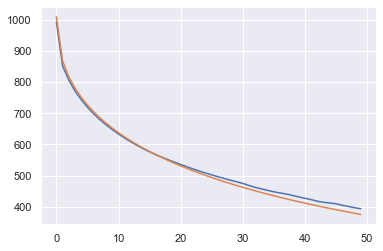

In [20]:
plt.plot(T,me)
plt.plot(T,SEM(T,params2[0],params2[1],params2[2]))

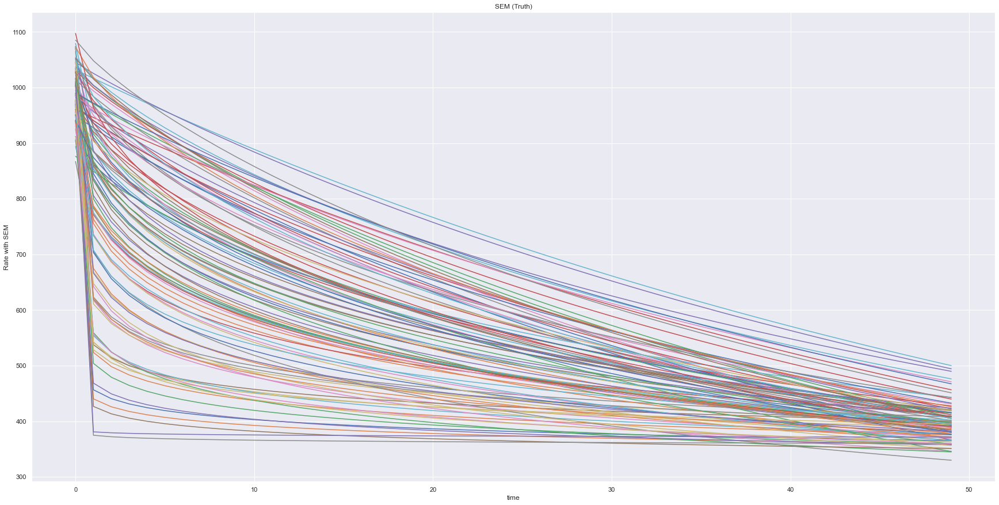

In [21]:
plt.figure(figsize=(30,15))
plt.plot(QS_DF)
plt.title('SEM (Truth)')
plt.xlabel('time')
plt.ylabel('Rate with SEM')
plt.show()

In [22]:
# SEM_T = go.Figure()
# for key, value in QS_DF.iteritems():
#     SEM_T.add_trace(go.Scatter(x=T, y=QS_DF[(key)], mode='lines', name=str(key), line=dict(color='gray')))
# SEM_T.update_layout(title={'text':'SEM Decline(True)','x':0.5,'y':0.85}, xaxis_title='Time (days)', yaxis_title='Oil Rate (bbl/day)')
# #fig_arps.update_layout(legend=dict(x=0.1,y=0.9,traceorder='normal',font=dict(size=15,)))
# SEM_T.show()

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         7.1595e+06                                    3.52e+04    
       1              2         4.7149e+06      2.44e+06       7.47e+01       1.40e+06    
       2              3         2.3257e+06      2.39e+06       1.84e+02       1.33e+06    
       3              4         1.2321e+06      1.09e+06       5.59e+01       6.33e+05    
       4              5         8.3695e+05      3.95e+05       9.24e+00       2.21e+05    
       5              6         6.7506e+05      1.62e+05       3.74e+01       5.06e+04    
       6              7         6.2563e+05      4.94e+04       2.83e+01       4.77e+03    
       7              8         6.2369e+05      1.94e+03       2.88e+00       2.92e+02    
       8              9         6.2365e+05      3.78e+01       2.26e-01       4.45e+00    
       9             10         6.2365e+05      4.49e-02       3.74e-03       5.64e-03    

C:\Users\siava\anaconda3\lib\site-packages\scipy\optimize\_lsq\least_squares.py:110: UserWarning: Setting `ftol` below the machine epsilon (2.22e-16) effectively disables the corresponding termination condition.
  warn("Setting `{}` below the machine epsilon ({:.2e}) effectively "


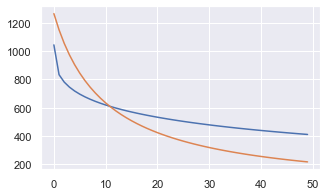

In [23]:
y=QS_DF['realization5']
T_=T
noise_sigma = T_/20
noise = np.ones((prod_time))   #np.random.randn(n) * noise_sigma
params2,cov = curve_fit(ArpsRate,T_,y/1,bounds=([900.0,.1,0.0],[1400,50,1]),verbose=2,sigma=1/noise**2,ftol =1e-99, absolute_sigma=True)
                            # po:range ,sill ,nugget 
q = params2[0]
D = params2[1]
b = params2[2]

print('for exponential variogram')
print('Q is:',round(q,9))
print('D is:',round(D,4))
print('b:',round(b,8))
print(cov)
plt.figure(figsize=(5,3))
plt.plot(T_,y)
plt.plot(T_,ArpsRate(T,q, D,b))

In [24]:
para_mat=np.zeros((3,N))
Cov_mat=np.zeros((3,N,3))
T_=T/max(T)

noise_sigma = T_/20

for i,column in tqdm(enumerate(QS_DF)):
    noise = np.random.rand(prod_time) * noise_sigma
    noise[noise<=0]=.01
    params,cov = curve_fit(ArpsRate,T_,QS_DF[column]/1      ,maxfev =100*1000,bounds=([950,.1,0.0001],[1000,3,.99999]),ftol=1.e-16,verbose=0,sigma=1/noise**2,
                           absolute_sigma=True)
    para_mat[:,i]=params
    Cov_mat[:,i,:]=cov
    

0it [00:00, ?it/s]

C:\Users\siava\anaconda3\lib\site-packages\scipy\optimize\_lsq\least_squares.py:110: UserWarning: Setting `ftol` below the machine epsilon (2.22e-16) effectively disables the corresponding termination condition.
  warn("Setting `{}` below the machine epsilon ({:.2e}) effectively "


In [25]:
ARP_Mdl=np.zeros((prod_time,N))
for i in range(N):
    ARP_Mdl[:,i]=ArpsRate(T,para_mat[0,i],para_mat[1,i],para_mat[2,i])

In [26]:

# ARPS_Model = go.Figure()
# for i in range(N):
#     ARPS_Model.add_trace(go.Scatter(x=T, y=ARP_Mdl[:,i], mode='lines', name='Model'+str(i)))
# ARPS_Model.update_layout(title={'text':'Arps Model','x':0.5,'y':0.85}, xaxis_title='Time (days)', yaxis_title='Oil Rate (bbl/day)')
# #fig_arps.update_layout(legend=dict(x=0.1,y=0.9,traceorder='normal',font=dict(size=15,)))
# ARPS_Model.show()

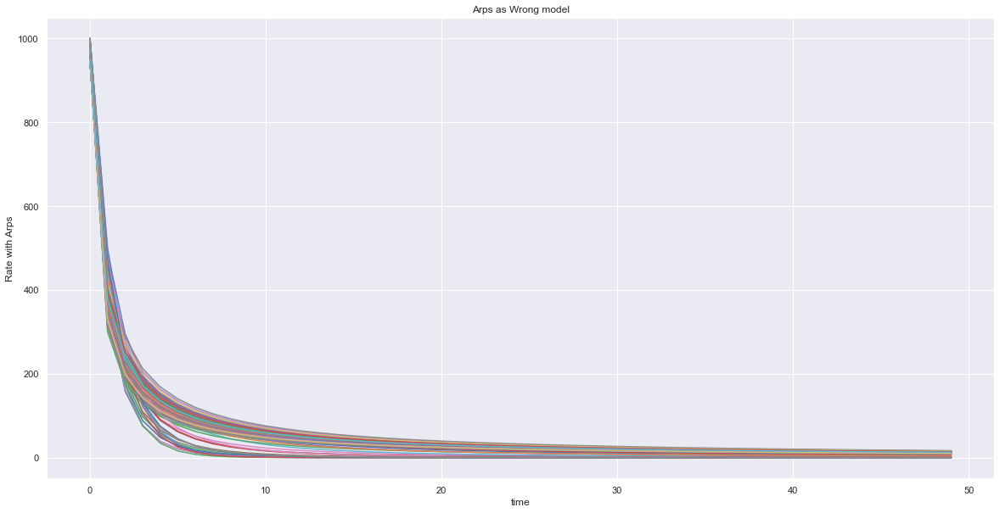

In [27]:
plt.figure(figsize=(20,10))
plt.plot(ARP_Mdl)
plt.title('Arps as Wrong model')
plt.xlabel('time')
plt.ylabel('Rate with Arps')
plt.show()

In [28]:
ARP_DF = pd.DataFrame(ARP_Mdl,columns=['realization'+str(i) for i in range(N)])

In [29]:
Mismatch = QS_DF- ARP_DF 

In [30]:
Mismatch.head(5)

,realization0,realization1,realization2,realization3,realization4,realization5,realization6,realization7,realization8,realization9,...,realization90,realization91,realization92,realization93,realization94,realization95,realization96,realization97,realization98,realization99
0,20.949015,10.354846,17.614544,21.897043,-45.892216,94.643165,25.018826,14.358739,23.894714,31.992614,...,-8.619199,-14.886321,58.826741,147.274096,54.647619,78.183804,-17.479080,85.192418,29.448143,-2.180467
1,129.305154,116.768053,169.300841,511.125244,405.522616,442.563330,281.657879,595.713422,412.579767,513.623050,...,497.280964,429.641019,485.751065,563.980834,314.649992,449.653575,225.299902,597.372105,215.766800,396.638246
2,242.883323,231.057620,276.034119,627.752340,503.470515,534.744504,374.728287,775.473524,504.022724,748.440801,...,603.383543,522.483683,580.004871,657.409135,406.900757,536.295010,323.754092,793.984841,315.042620,493.247541
3,289.518662,278.096146,318.562386,670.735611,536.705818,565.736292,408.351655,837.202940,534.355589,859.254062,...,639.176771,552.489881,610.198814,686.092704,439.821386,563.111769,360.943350,872.087365,352.909453,526.715255
4,314.085808,303.004200,340.052671,687.730190,548.901409,576.530531,423.114633,855.991104,545.139608,907.830454,...,651.443574,562.502928,619.471543,693.299124,453.710042,570.926807,378.497294,900.772526,371.094728,539.453167


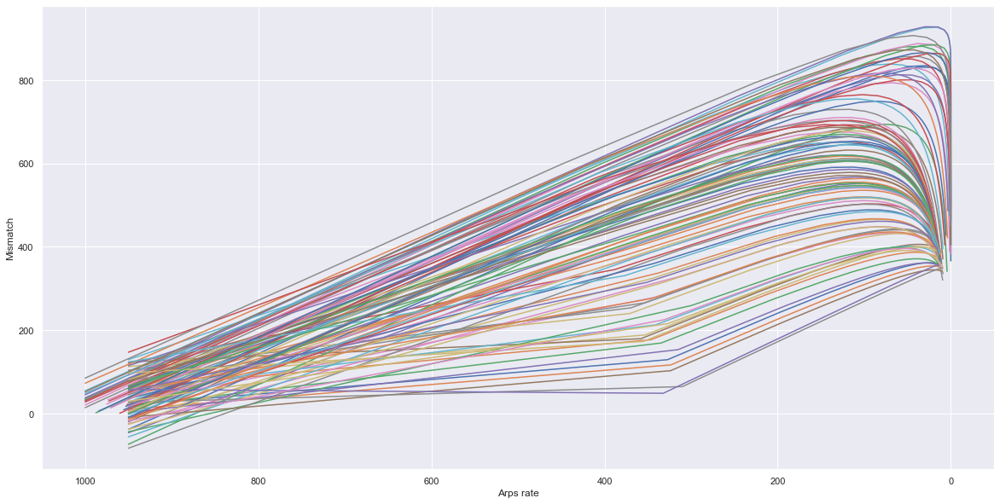

In [31]:
plt.figure(figsize=(20,10))
plt.plot(ARP_DF,Mismatch)
plt.xlabel('Arps rate')
plt.ylabel('Mismatch')
plt.gca().invert_xaxis()
plt.show()

In [32]:
# @jit(target ="cuda") 
def M_A(matX,matY,win_size):
    mn_range=np.min(matX); mx_range=np.max(matX)
    flt_X=matX.flatten()
    flt_Y=matY.flatten()
    save_mat=list()
    for p in tqdm(flt_X):
        lstX=list()
        lstY=list()
        for j in range(len(flt_X)):
            if (flt_X[j]>= (p/2-win_size))& (flt_X[j]<=p/2+win_size):
                lstY.append(flt_Y[j])
                lstX.append(flt_X[j])
        if len(lstY)==0:
            print( "Not in range")
            return
        CrCo_M=np.corrcoef(lstX,lstY)   
        mu=np.mean(lstY)
        sd=np.std(lstY)
        PC=np.percentile(lstY,[10,50,90])
        dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2],'Cor_Coef':CrCo_M[0,1]}
        save_mat.append(dic)    
    df= pd.DataFrame.from_dict(save_mat)
    df.sort_values(by=['x'],ascending=False, inplace=True)
    fig1 = go.Figure([
    go.Scatter(
        name='ave',
        x=df['x'],
        y=df['mean'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines'
    ),
    go.Scatter(
        name='P10',
        x=df['x'], 
        y=df['P10'], 
        line=dict(color='rgba(255,255,255)'),
        
    ),
        go.Scatter(
        name='P90',   
        x=df['x'], 
        y=df['P90'], 
        line=dict(color='rgba(255,0,255)'),
        
    ),
      go.Scatter(
        name='P50' ,   
        x=df['x'], 
        y=df['P50'], 
        line=dict(color='rgba(255,255,0)'),
        
    ),
    
        go.Scatter(
        name='STD' ,   
        x=df['x'], 
        y=df['STD'],
        line=dict(color='rgba(255,255,0)'),
        
    )])
    fig1.update_layout(
    xaxis=dict(visible=True,autorange='reversed'),    
    title="",
    xaxis_title="Arps rate(model)",
    yaxis_title="Mismatch",
    legend_title="window size{}".format(win_size),
    font=dict(
        family="Courier New, monospace",
        size=12
    ))
    fig1.show() 
    fig2 = go.Figure([
    go.Scatter(
        name='Cor_Coef',
        x=df['x'],
        y=df['Cor_Coef'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines'
    )])
    
    fig2.update_layout(
    xaxis=dict(visible=True,autorange='reversed'),    
    title="",
    xaxis_title="Arps rate(model)",
    yaxis_title="Correlation coefficients(Peasron) of Mismatch",
    legend_title="window size {}".format(win_size),
    font=dict(
        family="Courier New, monospace",
        size=12
    )),

    fig2.show()
    return df

In [33]:
df_out=M_A(np.array(ARP_DF),np.array(Mismatch),win_size=50)  

  0%|          | 0/5000 [00:00<?, ?it/s]

In [34]:
df_out

,x,mean,STD,P10,P50,P90,Cor_Coef
89,1.000000e+03,522.736144,32.733101,490.676916,513.820452,558.221104,-0.253028
19,1.000000e+03,522.736144,32.733101,490.676916,513.820452,558.221104,-0.253028
71,1.000000e+03,522.736144,32.733101,490.676916,513.820452,558.221104,-0.253028
64,1.000000e+03,522.736144,32.733101,490.676916,513.820452,558.221104,-0.253028
9,1.000000e+03,522.736144,32.733101,490.676916,513.820452,558.221104,-0.253028
...,...,...,...,...,...,...,...
4809,4.916612e-12,478.674555,117.600570,363.795103,443.423182,646.674860,-0.079562
4714,4.675901e-12,478.674555,117.600570,363.795103,443.423182,646.674860,-0.079562
4909,2.477858e-12,478.674555,117.600570,363.795103,443.423182,646.674860,-0.079562
4814,2.319968e-12,478.674555,117.600570,363.795103,443.423182,646.674860,-0.079562


In [35]:
# print('totlal',len(df_out))
# print('more than 800is',len(df_out[df_out['x']>800]))
# print('less than 300is',len(df_out[df_out['x']<300]))

In [36]:
# lst_size=np.arange(100,990,100)
# for i in lst_size:
#     M_A(np.array(ARP_DF),np.array(Mismatch),win_size=i)  

In [37]:
def M_A1(matX,matY,win_size):
    mn_range=np.min(matX); mx_range=np.max(matX)
    flt_X=matX.flatten()
    flt_Y=matY.flatten()
    
    save_mat=[]
    for p in tqdm(flt_X):
        lstX=[]
        lstY=[]
        
        for j in range(len(flt_X)):
            if (flt_X[j]>= (p/2-win_size))& (flt_X[j]<=p/2+win_size):
                lstY.append(flt_Y[j])
                lstX.append(flt_X[j])
        if len(lstY)==0:
            print( "Not in range")
            return
        CrCo_M=np.corrcoef(lstX,lstY)   
        mu=np.mean(lstY)
        sd=np.std(lstY)
        PC=np.percentile(lstY,[10,50,90])
        dic={'x':p,'mean':mu, 'STD': sd, 'P10':PC[0], 'P50':PC[1], 'P90':PC[2],'Cor_Coef':CrCo_M[0,1]}
        save_mat.append(dic)
    df= pd.DataFrame.from_dict(save_mat)
    df.sort_values(by=['x'],ascending=False, inplace=True)    
    return df

# how to score ???????
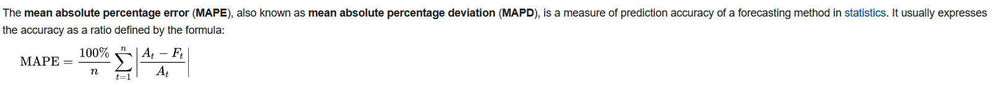

In [38]:
def MA_CV(matX,matY,win_size,K=.5):
    mn_range=np.min(matX); mx_range=np.max(matX)
    matX=matX.flatten()
    matY=matY.flatten()    
    flt_X, X_test, flt_Y, y_test = train_test_split(matX, matY, test_size=K, random_state=77)
    trn=M_A1(flt_X,flt_Y,win_size)
    tst=M_A1(X_test,y_test,win_size)
#     score=1-(trn.div(tst))
    return trn,tst

In [39]:
tr,ts=MA_CV(np.array(ARP_DF),np.array(Mismatch),win_size=200,K=.2)  

  0%|          | 0/4000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [40]:
ARP_DF

,realization0,realization1,realization2,realization3,realization4,realization5,realization6,realization7,realization8,realization9,...,realization90,realization91,realization92,realization93,realization94,realization95,realization96,realization97,realization98,realization99
0,950.000000,950.000000,950.000133,951.499979,950.000000,950.000000,950.000000,999.999895,950.000002,1.000000e+03,...,950.000000,950.000000,950.000000,950.000000,950.000000,950.000000,950.000000,1000.000000,950.000000,950.000004
1,327.236502,323.466705,334.712458,409.170467,367.493893,390.512653,335.854124,388.065370,362.867202,5.028383e+02,...,376.793909,357.771261,381.941076,399.099055,351.627844,370.116116,330.958745,450.719675,327.036301,377.305659
2,197.660868,194.916589,203.142195,260.622004,227.808765,245.769636,203.983877,183.105754,224.263621,2.528583e+02,...,234.999942,220.383535,239.017832,252.610436,215.739848,229.827531,200.383469,226.154993,197.514799,235.398198
3,141.593823,139.483645,145.821715,191.205131,165.066449,179.308804,146.472479,98.233843,162.278296,1.271589e+02,...,170.745321,159.235339,173.931870,184.785121,155.605311,166.657521,143.691650,123.148553,141.481394,171.060737
4,110.305326,108.598800,113.730401,150.988989,129.421516,141.141363,114.258300,57.712847,127.137922,6.394943e+01,...,134.083558,124.649627,136.705937,145.672333,121.686707,130.726229,112.003816,71.521330,110.214354,134.342925
5,90.342069,88.911690,93.216082,124.750237,106.437121,116.370776,93.659425,36.280840,104.507428,3.216230e+01,...,110.382592,102.406926,112.605406,120.224747,99.908713,107.540493,91.766758,43.757929,90.265791,110.602327
6,76.497405,75.267035,78.971445,106.280807,90.385273,98.996641,79.353314,24.034350,88.715992,1.617626e+01,...,93.801890,86.900261,95.728882,102.345858,84.742511,91.340263,77.723505,27.946990,76.431777,93.992314
7,66.332174,65.253086,68.503237,92.574949,78.540512,86.136463,68.838488,16.600442,77.070373,8.136350e+00,...,81.551868,75.472104,83.251675,89.096151,73.573928,79.381910,67.407918,18.504125,66.274605,81.719797
8,58.551627,57.590863,60.485463,82.000269,69.440499,76.233343,60.784181,11.863110,68.127379,4.092622e+00,...,72.131827,66.700397,73.651942,78.883828,65.006436,70.192262,59.509688,12.633574,58.500364,72.281973
9,52.404718,51.538986,54.147867,73.593768,62.230249,68.372535,54.417200,8.721162,61.044022,2.058705e+00,...,64.662648,59.755353,66.037198,70.771852,58.226146,62.909530,53.268209,8.856493,52.358521,64.798395


In [41]:
ts.reset_index(drop=True,inplace=True)
ts

,x,mean,STD,P10,P50,P90,Cor_Coef
0,9.500000e+02,467.339769,127.116441,292.441818,496.678618,597.886093,0.454304
1,9.500000e+02,467.339769,127.116441,292.441818,496.678618,597.886093,0.454304
2,9.500000e+02,467.339769,127.116441,292.441818,496.678618,597.886093,0.454304
3,9.500000e+02,467.339769,127.116441,292.441818,496.678618,597.886093,0.454304
4,9.500000e+02,467.339769,127.116441,292.441818,496.678618,597.886093,0.454304
...,...,...,...,...,...,...,...
995,7.268670e-09,497.870283,128.738911,364.924251,464.977665,684.142845,0.198679
996,4.297556e-09,497.870283,128.738911,364.924251,464.977665,684.142845,0.198679
997,7.624796e-11,497.870283,128.738911,364.924251,464.977665,684.142845,0.198679
998,3.841997e-11,497.870283,128.738911,364.924251,464.977665,684.142845,0.198679


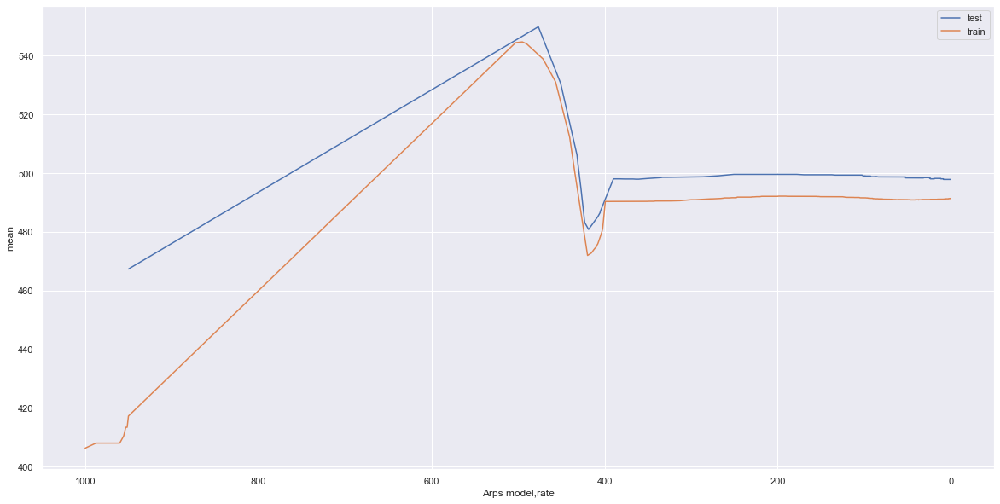

In [42]:
plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['mean'],label='test')
plt.plot(tr['x'],tr['mean'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('mean')
plt.gca().invert_xaxis()
plt.show()

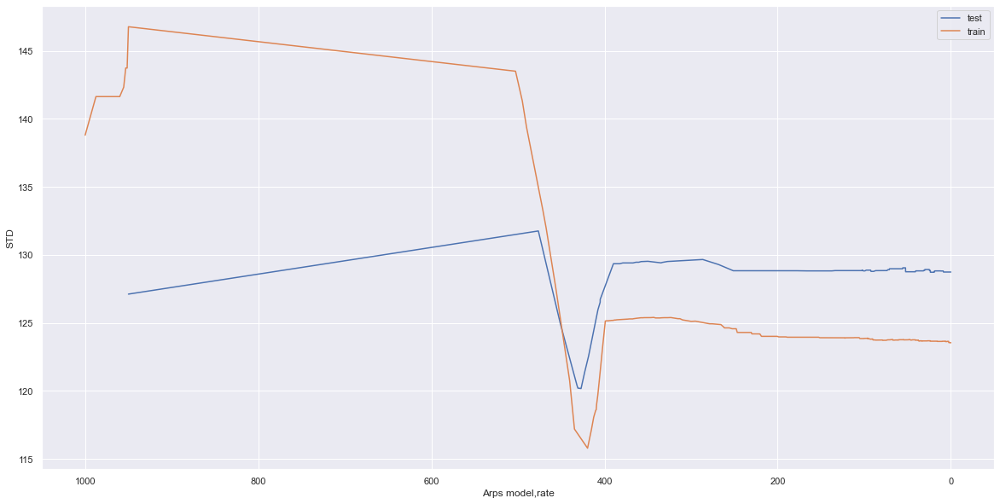

In [43]:

plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['STD'],label='test')
plt.plot(tr['x'],tr['STD'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('STD')
plt.gca().invert_xaxis()
plt.show()

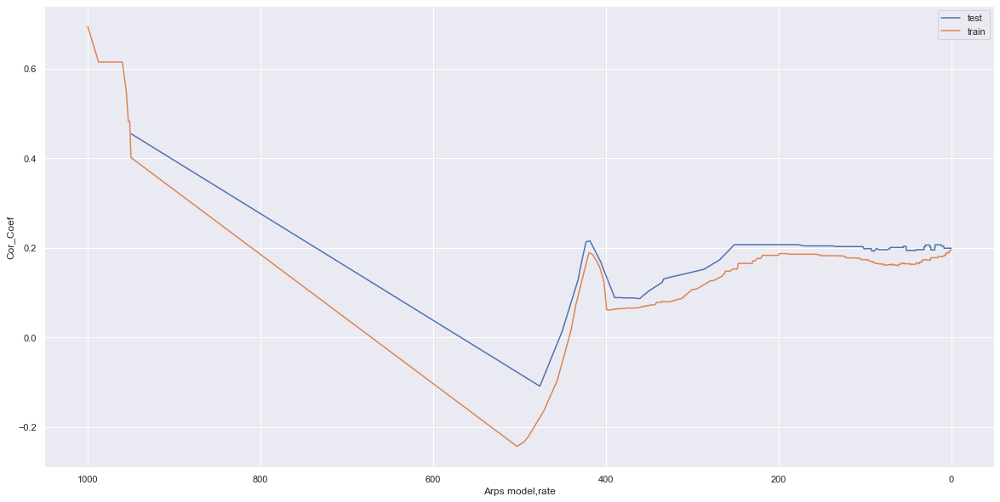

In [44]:
plt.figure(figsize=(20,10))
plt.plot(ts['x'],ts['Cor_Coef'],label='test')
plt.plot(tr['x'],tr['Cor_Coef'],label='train')
plt.legend()
plt.xlabel('Arps model,rate')
plt.ylabel('Cor_Coef')
plt.gca().invert_xaxis()
plt.show()


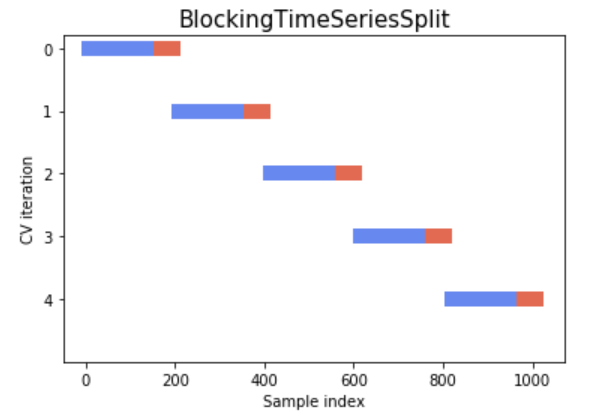

In [45]:
sft=df_out-df_out.shift(1)

In [46]:
df_out['x']

89      1.000000e+03
19      1.000000e+03
71      1.000000e+03
64      1.000000e+03
9       1.000000e+03
            ...     
4809    4.916612e-12
4714    4.675901e-12
4909    2.477858e-12
4814    2.319968e-12
4914    1.151118e-12
Name: x, Length: 5000, dtype: float64

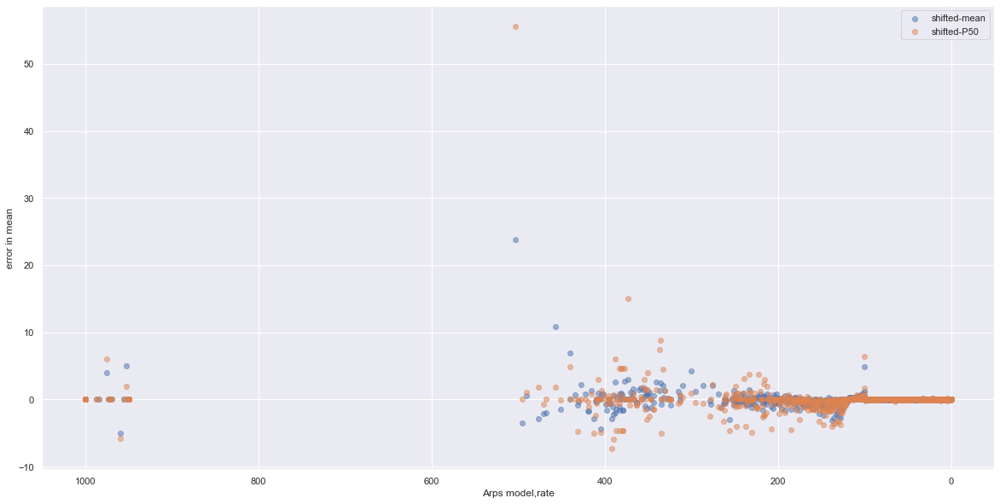

In [47]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['mean'],label='shifted-mean',alpha=.5)
plt.scatter(df_out['x'],sft['P50'],label='shifted-P50',alpha=.5)
plt.xlabel('Arps model,rate')
plt.ylabel('error in mean')
plt.legend()
plt.gca().invert_xaxis()
plt.show()


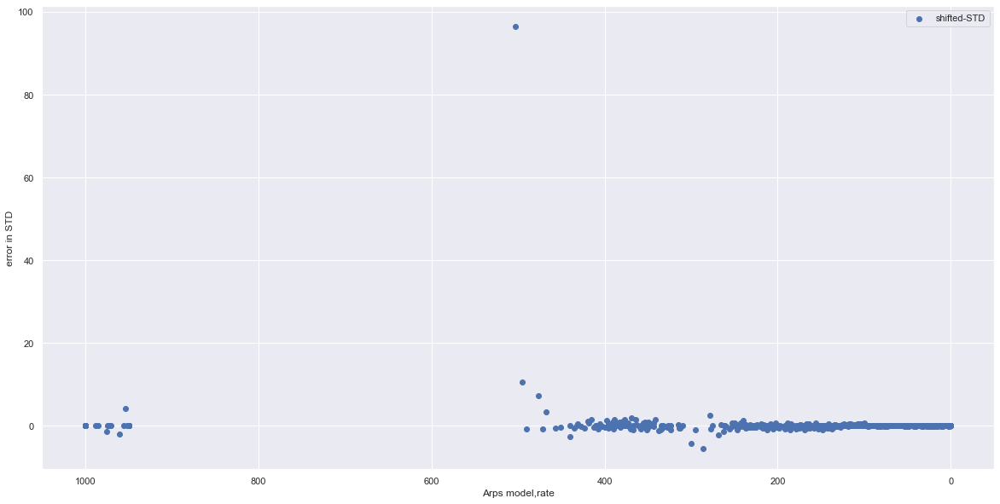

In [48]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['STD'],label='shifted-STD')
plt.xlabel('Arps model,rate')
plt.ylabel('error in STD')
plt.legend()
plt.gca().invert_xaxis()
plt.show()

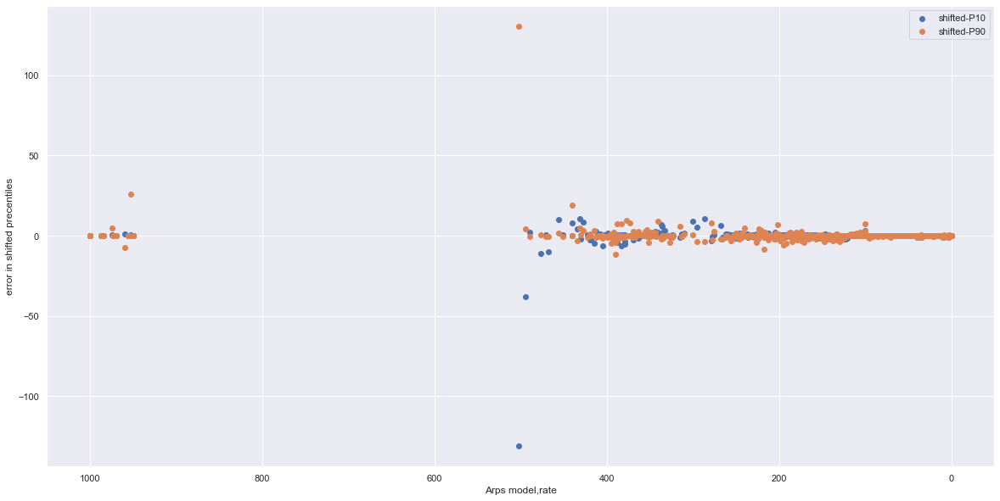

In [49]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['P10'],label='shifted-P10')
plt.scatter(df_out['x'],sft['P90'],label='shifted-P90')
plt.xlabel('Arps model,rate')
plt.ylabel('error in shifted precentiles')
plt.legend()
plt.gca().invert_xaxis()
plt.show()

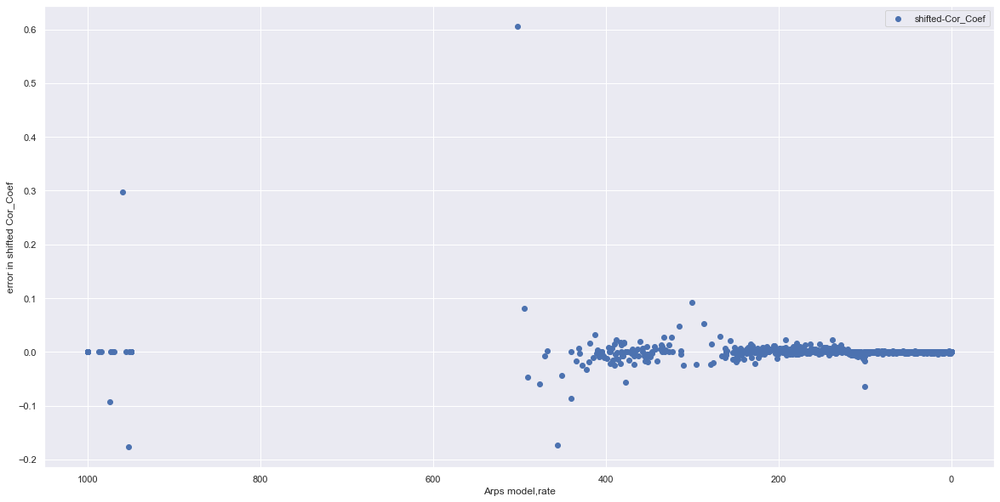

In [50]:
plt.figure(figsize=(20,10))
plt.scatter(df_out['x'],sft['Cor_Coef'],label='shifted-Cor_Coef')
plt.xlabel('Arps model,rate')
plt.ylabel('error in shifted Cor_Coef')
plt.legend()
plt.gca().invert_xaxis()
plt.show()

### Generating _Truth_ and _Observation_ with SEM Model

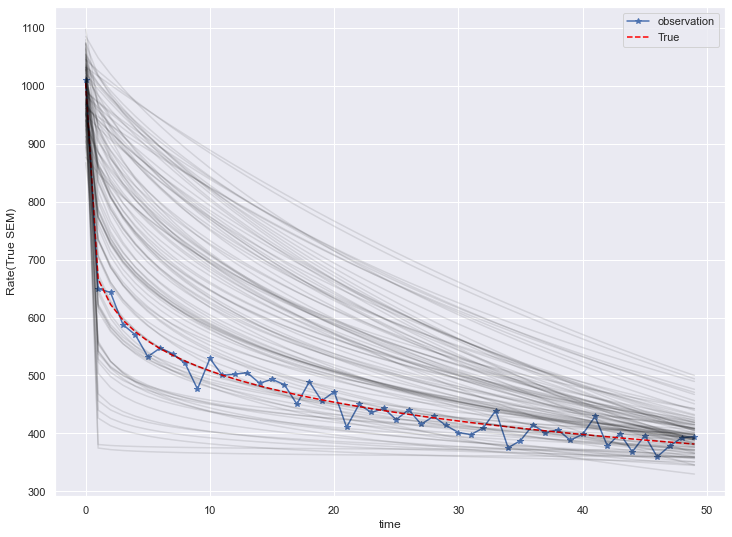

In [51]:
rnd=random.randint(0,N-1)
tr = QS_DF['realization'+str(rnd)]
obs_SEM = tr + ss.norm.rvs(0,20,prod_time)
plt.figure(figsize=(12,9))
plt.plot(T,obs_SEM, 'b-*',label='observation')
plt.plot(T,tr,label='True', color='red',linestyle='--')
plt.plot(QS_DF,alpha=.1,color='black')
plt.ylabel('Rate(True SEM)')
plt.xlabel('time')
plt.legend()
plt.show()

In [52]:
# fig_stats = go.Figure()
# fig_stats.add_trace(go.Scatter(x=T, y=Tru_SEM, mode='lines', name='Truth', line=dict(color='red')))
# fig_stats.add_trace(go.Scatter(x=np.asarray(obs_SEM)[:,0], y=np.asarray(obs_SEM)[:,1], mode='markers', name='measurment', line=dict(color='blue')))
# fig_stats.update_layout(legend=dict(x=0.8,y=0.9,traceorder='normal',font=dict(size=15,)))
# fig_stats.show()

# main ENKF

In [53]:
# def EnKF(mf_k, Xf_k, gf_k, d, par1, par2, FM,st_df=0, up_time=15, r=.5):
#     R = 0 * np.eye(up_time)
#     Yf_k_new=np.concatenate((mf_k,Xf_k,gf_k))
#     N=mf_k.shape[1]
    
#     for time in range (up_time):
#         Vk=np.random.multivariate_normal(np.zeros(up_time), np.power(R,2), N).T
#         Cd_k= 1/(N-1)* Vk @ Vk.T  #r * np.eye(2*up_time)                                   
#         obs_real= np.asmatrix(d[time])
#         dk =  np.asarray(obs_real + Vk) 
#         Yf_k = Yf_k_new
#         Pf_k = np.cov(Yf_k_new)                                                #error covariance matrix
#         H = gf_k @  sla.pinv(Yf_k)
#         Kk= (Pf_k @ H.T) @ sla.pinv(H @ Pf_k @ H.T + Cd_k)                     #Kalman gain
#         Yu_k_new = Yf_k + Kk @ (dk - H @ Yf_k)  
#         #Pu_k_new = np.cov(Yu_k_new)
#         Q0_k = Yu_k_new[0,:]
# #        m = np.vstack((x_k,D_k,b_k))
#         if FM=='Arps':
#             y=ArpsRate(np.array([range(up_time)]).T,Q0_k,par1 , par2)  #Arps(time, Q, Di0, b)
#         else:
#             y=SEM(np.array(([range(up_time)])*N).T,np.array(np.matrix(SEM_par[0,:]))[0,:],par1,par2)                            
#         Yf_k_new=np.concatenate((Q0_k,y,y))
#     return Q0_k,Yf_k_new[1:up_time+1,:]

# EnkF V2

In [54]:
# def EnKF(mf_k, Xf_k, gf_k, d, par1, par2, FM,st_df=0, up_time=15, r=.5):
#     R = r * np.eye(up_time)

#     Yf_k_new=np.concatenate((mf_k, np.asarray([par1]), np.asarray([par2]), Xf_k, gf_k))
#     N=mf_k.shape[1]
#     evolution=np.zeros((up_time,up_time,N))
#     for time in range (up_time):
#         Vk=np.random.multivariate_normal(np.zeros(up_time), R**2, N).T
#         Cd_k= 1/(N-1)* Vk @ Vk.T  #r * np.eye(2*up_time) 
#         obs_real= np.asmatrix(d[time])
#         dk =  np.asarray(obs_real + Vk) 
#         Yf_k = Yf_k_new
#         Pf_k = np.cov(Yf_k_new)                                                #error covariance matrix
#         H = gf_k @  sla.pinv(Yf_k)
#         Kk= (Pf_k @ H.T) @ sla.pinv(H @ Pf_k @ H.T + Cd_k)                     #Kalman gain
#         print('d',dk)
#         print('obs_real',obs_real)
#         Yu_k_new = Yf_k + Kk @ (dk - H @ Yf_k)  
#         #Pu_k_new = np.cov(Yu_k_new)
#         Q0_k = Yu_k_new[0,:]
# #         print('q0',Yu_k_new[0,:])
# #         print('d',Yu_k_new[1,:])
# #         print('b',Yu_k_new[2,:])
# #        m = np.vstack((x_k,D_k,b_k))
#         if FM=='Arps':
#             y=ArpsRate(np.array([range(up_time)]).T,Q0_k,par1 , par2)          #Arps(time, Q, Di0, b)
#         else:
#             y=SEM(np.array(([range(up_time)])*N).T,np.array(np.matrix(SEM_par[0,:]))[0,:],par1,par2)                            
#         Yf_k_new=np.concatenate((mf_k, np.asarray([par1]), np.asarray([par2]),y,y))
#         evolution[time,:,:]=Yf_k_new[3:up_time+3,:]
#     return Q0_k,Yf_k_new[3:up_time+3,:],evolution

# EnKF V3

In [55]:
def EnKF(mf_k,Xf_k, gf_k, d, par1, par2, FM, pa_up ,st_df=0, r=.5):
    np.random.seed(1366)
    random.seed(586)
    R = r * np.eye(1)
    N=mf_k.shape[1]
    nobs=(obs_SEM).shape[0]
    Y_f_ = np.zeros([5,N,nobs+1])
    P_f_ = np.zeros([5,5,nobs+1])
    Y_a_ = np.zeros([5,N,nobs+1])
    P_a_ = np.zeros([5,5,nobs+1])
    Y_f_[0,:,0] = mf_k
    Y_f_[3,:,0] = mf_k
    Y_f_[4,:,0] = mf_k
    Y_f_[1,:,0] = par1; Y_f_[2,:,0] = par2
    P_f_[:,:,0] = np.cov(Y_f_[:,:,0])
    Y_a_[0,:,0] = mf_k
    Y_a_[3,:,0] = mf_k
    Y_a_[4,:,0] = mf_k
    Y_a_[1,:,0] = par1; Y_a_[2,:,0] = par2
    P_a_[:,:,0] = np.cov(Y_a_[:,:,0])
    for t in tqdm(range(nobs)):
        Q0 = Y_a_[0,:,t]
        lnq_a_before_ens = Y_a_[3,:,t]
        if FM=='Arps':
            Qt=ArpsRate(np.array([range(t+1)]).T, Q0 ,par1 , par2)          #Arps(time, Q, Di0, b)
        else:
            Qt=SEM(np.array(([range(t+1)])*N).T, Q0 ,par1,par2)  #SEM(time, Q, Tau, n)
        Y_f_[0,:,t+1] = Q0
        Y_f_[3,:,t+1] = Qt[t,:]
        Y_f_[4,:,t+1] = Qt[t,:]
        if pa_up== True:
            Y_f_[1,:,t+1] = Y_a_[1,:,t];Y_f_[2,:,t+1] = Y_a_[2,:,t]
        else:
            Y_f_[1,:,t+1] = par1;Y_f_[2,:,t+1] = par2
        Y_f_now = Y_f_[:,:,t+1]
        P_f_now = np.cov(Y_f_now)*N/np.sqrt(N-1)
        P_f_[:,:,t+1] = P_f_now
        H = np.array([Qt[t,:] @  sla.pinv(Y_f_now)])   
        K = P_f_now @ H.T @ sla.pinv(H @ P_f_now @ H.T + R)
        y = d[t] + ss.norm.rvs(0,r**.5,1) # measurement + noise
        Y_a_now = Y_f_now + K @ (y - H @ Y_f_now)
        P_a_now = np.cov(Y_a_now)
        Y_a_[:,:,t+1] = Y_a_now
        P_a_[:,:,t+1] = P_a_now
        
    return Y_a_

In [56]:
Arps_updated= EnKF(mf_k=np.matrix(para_mat[0,:]),                      #state_variables,, 
                    Xf_k=np.array(ARP_DF),                            #dynamic_reservoir_model
                    gf_k=np.array(ARP_DF),                           #observation_current
                    d=np.asarray(obs_SEM),                            #measurements
                    par1=(para_mat[1,:]),                             #paramter1
                    par2=(para_mat[2,:]),                             #parameter2                                                    
                    r=20,                                             # measurements error (STD)
                    FM='Arps',                                        #forward model
                    st_df= df_out,                                     #statistical data
                   pa_up=False,                                        #updating parameters
                  )



print("RMSE Arps_updated/measurment is ",RMSE ( (np.array(obs_SEM) * np.ones((N,prod_time))),Arps_updated[4,:,1:]))
print("RMSE Arps_updated/true is ",RMSE ( (np.array(tr) * np.ones((N,prod_time))),Arps_updated[4,:,1:]))

  0%|          | 0/50 [00:00<?, ?it/s]

RMSE Arps_updated/measurment is  10.442302067371516
RMSE Arps_updated/true is  17.206015400341972


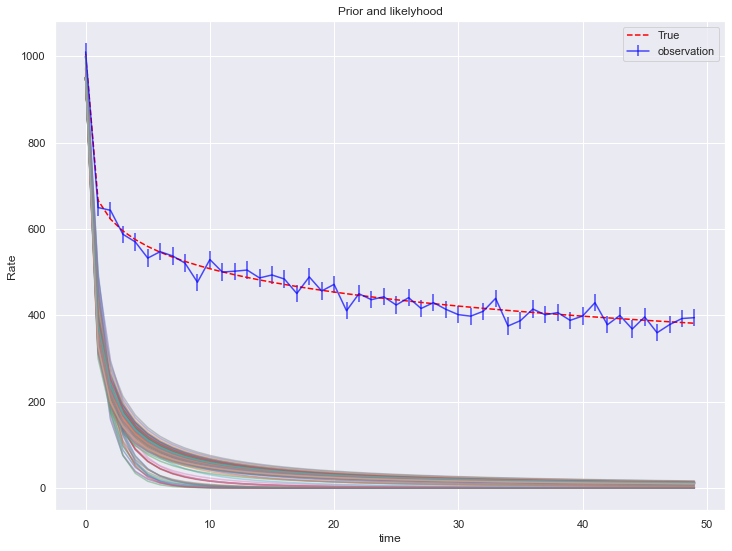

In [57]:
plt.figure(figsize=(12,9))
plt.errorbar(T,np.asarray(obs_SEM), yerr = 20,color='blue',label='observation',alpha=.7)
plt.plot(T,tr,label='True', color='red',linestyle='--')
plt.plot(T,ARP_DF,alpha=.5)
plt.ylabel('Rate')
plt.xlabel('time')
plt.title('Prior and likelyhood')
plt.legend()
plt.show()

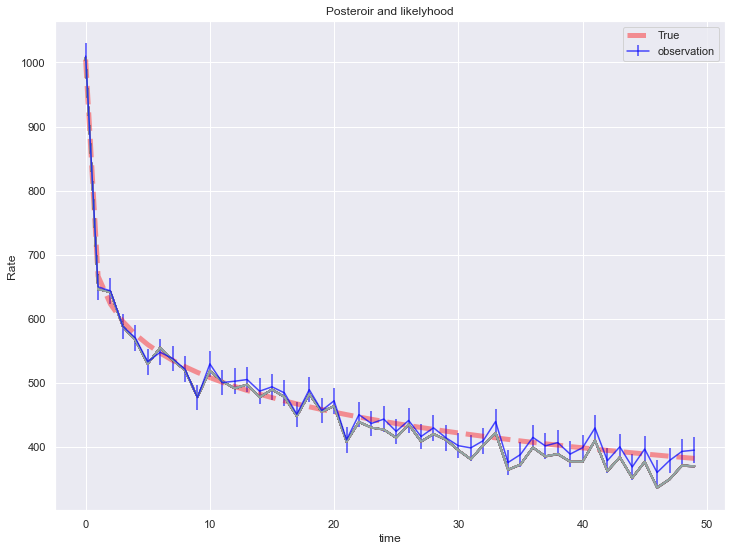

In [58]:
plt.figure(figsize=(12,9))
plt.errorbar(T,np.asarray(obs_SEM), yerr = 20,color='blue',label='observation',alpha=.7)
plt.plot(T,tr,label='True', color='red',linestyle='--',linewidth=5,alpha=0.4)
plt.plot(T,Arps_updated[3,:,1:].T,alpha=.5)
plt.ylabel('Rate')
plt.xlabel('time')
plt.title('Posteroir and likelyhood')
plt.legend()
plt.show()

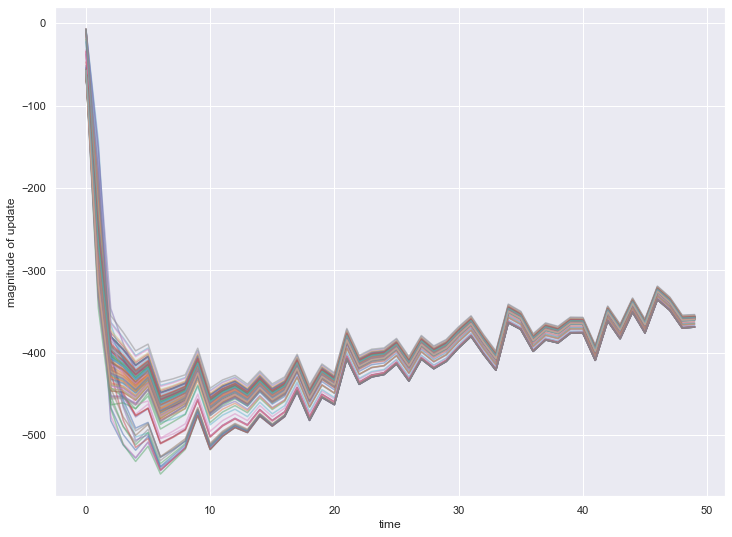

In [59]:
plt.figure(figsize=(12,9))
plt.plot(T,ARP_DF-Arps_updated[4,:,1:].T,alpha=.5)
plt.ylabel('magnitude of update')
plt.xlabel('time')
plt.show()



In [60]:
SEM_update= EnKF(mf_k=np.matrix(SEM_par[0,:]),                      #state_variables,, 
                    Xf_k=np.array(QS_DF),                            #dynamic_reservoir_model
                    gf_k=np.array(QS_DF),                           #observation_current
                    d=np.asarray(obs_SEM).T,                        #measurements
                    par1=(SEM_par[1,:]),                            #paramter 1
                    par2=(SEM_par[2,:]),                            #paramter 2
                    r=20,                                           #R measurments error
                    FM='SEM',                                       #foreward model
                    pa_up=False)                                    # updating paramter

print("RMSE SEM_update/measrment is ",RMSE ( (np.array(obs_SEM) * np.ones((N,prod_time))),SEM_update[4,:,1:]))
print("RMSE SEM_update/ture is ",RMSE ( (np.array(tr) * np.ones((N,prod_time))),SEM_update[4,:,1:]))

  0%|          | 0/50 [00:00<?, ?it/s]

RMSE SEM_update/measrment is  3.232392620980919
RMSE SEM_update/ture is  13.04738943128553


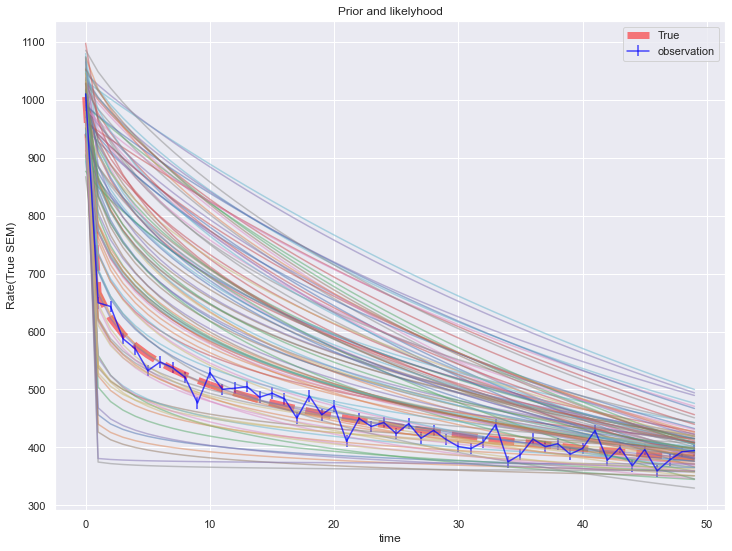

In [61]:
plt.figure(figsize=(12,9))
plt.errorbar(T,np.asarray(obs_SEM), yerr = 10,color='blue',label='observation',alpha=.7,)
plt.plot(T,tr,label='True', color='red',linestyle='--',linewidth=7,alpha=.5)
plt.plot(T,QS_DF,alpha=.5)
plt.ylabel('Rate(True SEM)')
plt.xlabel('time')
plt.title('Prior and likelyhood')
plt.legend()
plt.show()

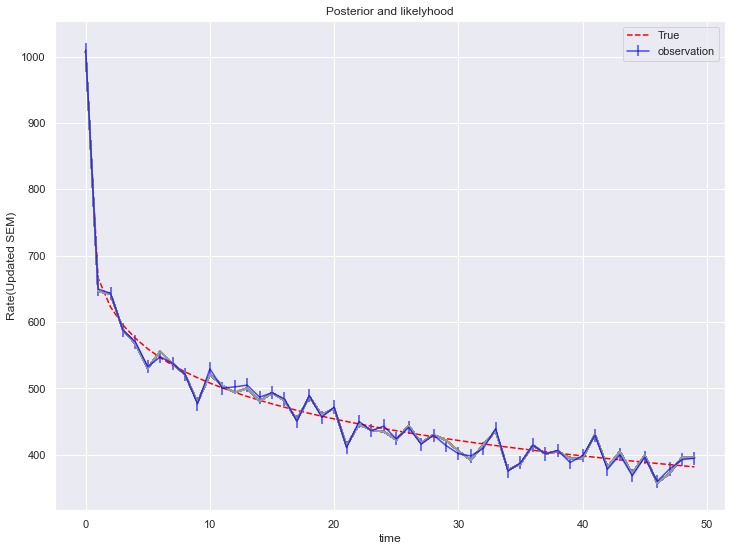

In [62]:
plt.figure(figsize=(12,9))
plt.errorbar(T,np.asarray(obs_SEM), yerr = 10,color='blue',label='observation',alpha=.7)
plt.plot(T,tr,label='True', color='red',linestyle='--',linewidth=1.5)
plt.plot(T,(SEM_update[4,:,1:]).T,alpha=.4)
plt.ylabel('Rate(Updated SEM)')
plt.xlabel('time')
plt.title('Posterior and likelyhood')
plt.legend()
plt.show()

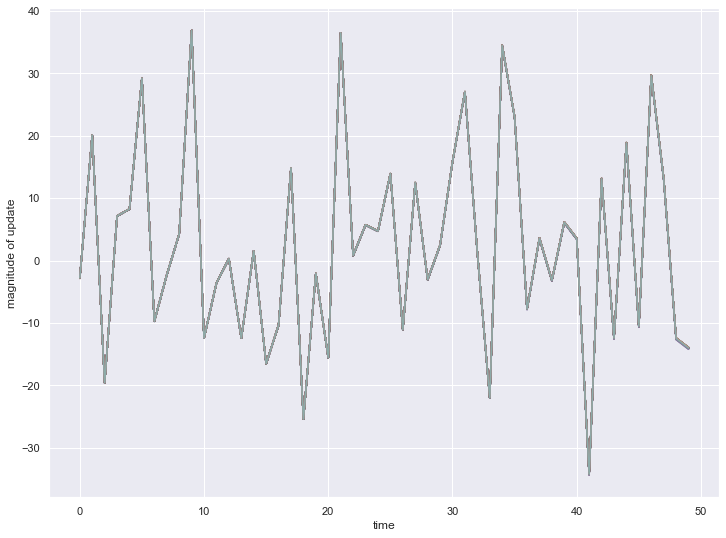

In [63]:
plt.figure(figsize=(12,9))
plt.plot(T,(np.array(tr) * np.ones((N,prod_time))).T-SEM_update[4,:,1:].T,alpha=.5)
plt.ylabel('magnitude of update')
plt.xlabel('time')
plt.show()

In [64]:
# plt.figure(figsize = (12,7))
# plt.plot(SEM_update[4,:,1:].T.mean(axis=0),label='mean')
# plt.plot(SEM_update[4,:,1:].T.std(axis=0),label='std')
# plt.legend()

In [65]:
# plt.figure(figsize = (12,7))
# plt.plot(((np.array(tr) * np.ones((N,prod_time))).T-SEM_update[4,:,1:].T).mean(axis=1),label='mean')
# plt.plot(((np.array(tr) * np.ones((N,prod_time))).T-SEM_update[4,:,1:].T).std(axis=1),label='std')
# plt.legend()

In [66]:
def interpolator(df, xx):
    srt=df.sort_values(by=['x'], axis=0, ascending=True, inplace=False)
    mu = np.interp(xx,srt['x'],srt['mean'])
    std = np.interp(xx,srt['x'],srt['STD'])
    error_trm = ss.norm.rvs(mu,std,1)
    return error_trm
    

In [67]:
# EnKF V4 with adding model error

In [72]:
def EnKF_error(mf_k,Xf_k, gf_k, d, par1, par2, FM, pa_up ,st_df=0, r=.5):
    np.random.seed(1366)
    random.seed(586)
    R = r * np.eye(1)
    N=mf_k.shape[1]
    nobs=(obs_SEM).shape[0]
    emf_K = np.zeros(mf_k.shape)
    Y_f_ = np.zeros([5,N,nobs+1])
    P_f_ = np.zeros([5,5,nobs+1])
    Y_a_ = np.zeros([5,N,nobs+1])
    P_a_ = np.zeros([5,5,nobs+1])
    Y_f_[0,:,0] = mf_k + emf_K
    Y_f_[1,:,0] = par1; Y_f_[2,:,0] = par2
    Y_f_[3,:,0] = mf_k + emf_K
    Y_f_[4,:,0] = mf_k + emf_K
    P_f_[:,:,0] = np.cov(Y_f_[:,:,0])
    Y_a_[0,:,0] = mf_k + emf_K
    Y_a_[1,:,0] = par1; Y_a_[2,:,0] = par2
    Y_a_[3,:,0] = mf_k + emf_K
    Y_a_[4,:,0] = mf_k + emf_K
    P_a_[:,:,0] = np.cov(Y_a_[:,:,0])
    for t in tqdm(range(nobs)):
        Q0 = Y_a_[0,:,t]
        Q0e = np.zeros(Q0.shape)
        for v in range(Q0.shape[0]):
            Q0e[v] = interpolator(st_df,Q0[v])
        Q0=Q0+Q0e    
        lnq_a_before_ens = Y_a_[3,:,t]

        if FM=='Arps':
            Qt=ArpsRate(np.array([range(t+1)]).T, Q0 ,par1 , par2)          #Arps(time, Q, Di0, b)
        else:
            Qt=SEM(np.array(([range(t+1)])*N).T, Q0 ,par1,par2)             #SEM(time, Q, Tau, n)

        #### recheck this part
        Y_f_[0,:,t+1] = Q0
        Y_f_[3,:,t+1] = Qt[t,:]
        Y_f_[4,:,t+1] = Qt[t,:]
 
        if pa_up== True:
            Y_f_[1,:,t+1] = Y_a_[1,:,t];Y_f_[2,:,t+1] = Y_a_[2,:,t]
        else:
            Y_f_[1,:,t+1] = par1;Y_f_[2,:,t+1] = par2
        Y_f_now = Y_f_[:,:,t+1]
        P_f_now = np.cov(Y_f_now)*N/np.sqrt(N-1)
        P_f_[:,:,t+1] = P_f_now

        H = np.array([Qt[t,:] @  sla.pinv(Y_f_now)])   
        K = P_f_now @ H.T @ sla.pinv(H @ P_f_now @ H.T + R)
        y = d[t] + ss.norm.rvs(0,r**.5,1) # measurement + noise
        print('p1',Y_f_now[1,2:4])
        print('p2',Y_f_now[2,2:4])
        Y_a_now = Y_f_now + K @ (y - H @ Y_f_now)
        P_a_now = np.cov(Y_a_now)
        Y_a_[:,:,t+1] = Y_a_now
        P_a_[:,:,t+1] = P_a_now
        
    return Y_a_

In [74]:
Ar_er_up= EnKF_error(mf_k=np.matrix(para_mat[0,:]),                      #state_variables,, 
                    Xf_k=np.array(ARP_DF),                                 #dynamic_reservoir_model
                    gf_k=np.array(ARP_DF),                                 #observation_current
                    d=np.asarray(obs_SEM).T,                              #measurements
                    par1=(para_mat[1,:]),                                  #DCA paramter 1
                    par2=(para_mat[2,:]),                                  #DCA paramter 2
                    r=10,                                                 #R measurments error
                    FM='Arps',                                             #foreward model
                    st_df=df_out,                                         #error paramters
                    pa_up=True)                                          #updating paramter

print("RMSE with model error/ measurment is ",RMSE ( (np.array(obs_SEM) * np.ones((N,prod_time))),Ar_er_up[4,:,1:]))
print("RMSE with model error/ ture is ",RMSE ( (np.array(tr) * np.ones((N,prod_time))),Ar_er_up[4,:,1:]))

  0%|          | 0/50 [00:00<?, ?it/s]

p1 [1.83824624 1.32543023]
p2 [0.99999 0.99999]
p1 [3.31806911 2.84620541]
p2 [1.97535642 2.0023485 ]
p1 [2.87838852 2.77997236]
p2 [1.76232078 1.97025703]
p1 [3.19012592 2.93352319]
p2 [2.41302253 2.29076972]
p1 [3.29111414 2.97708441]
p2 [2.63320764 2.38574645]
p1 [3.31994362 2.9897916 ]
p2 [2.69912232 2.41479973]
p1 [3.33053131 2.99378998]
p2 [2.7233256  2.42393995]
p1 [3.33693714 2.99674509]
p2 [2.73855834 2.43096705]
p1 [3.34103803 2.99856086]
p2 [2.74812822 2.43520436]
p1 [3.34382444 2.99972614]
p2 [2.75345981 2.43743403]
p1 [3.34603316 3.00032446]
p2 [2.75731767 2.43847909]
p1 [3.34801048 3.00122041]
p2 [2.76103837 2.44016498]
p1 [3.34945533 3.00173946]
p2 [2.76346179 2.44103557]
p1 [3.35116066 3.00246359]
p2 [2.76588624 2.44206506]
p1 [3.35188959 3.00277494]
p2 [2.76734342 2.44268748]
p1 [3.35316001 3.00325917]
p2 [2.76906436 2.44334342]
p1 [3.35407702 3.00363589]
p2 [2.77063155 2.44398725]
p1 [3.35438641 3.00374991]
p2 [2.771407   2.44427303]
p1 [3.35465626 3.00381386]
p2 [2.7

In [70]:
# RMSE with model error/ measurment is  2.184189465174983
# RMSE with model error/ ture is  14.568135512475697

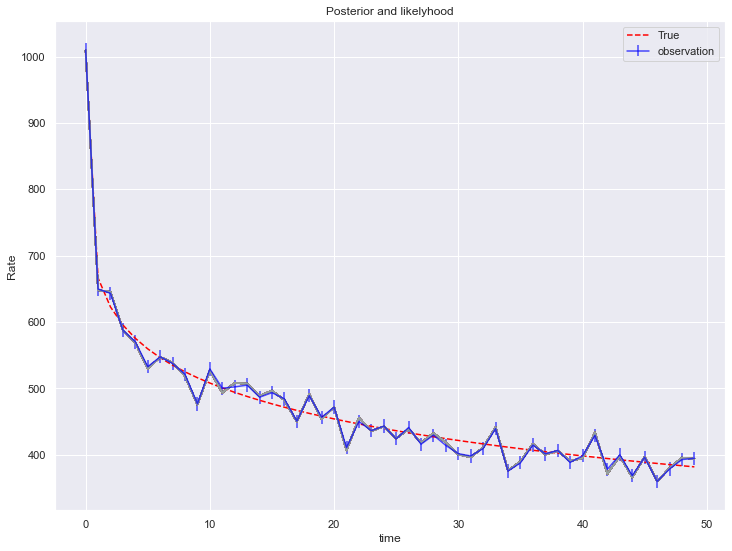

In [71]:
plt.figure(figsize=(12,9))
plt.errorbar(T,np.asarray(obs_SEM), yerr = 10,color='blue',label='observation',alpha=.7)
plt.plot(T,tr,label='True', color='red',linestyle='--',linewidth=1.5)
plt.plot(T,(Ar_er_up[4,:,1:]).T,alpha=.4)
plt.ylabel('Rate')
plt.xlabel('time')
plt.title('Posterior and likelyhood')
plt.legend()
plt.show()